## Project Overview


#### Main Goal

1. The main goal was to create a general topology of an area of campus.
3. After collecting data, we utilized 1D fitting algorithms to create topologies for individual streets.
4. Using all of the collected data, we performed 2D regression to create a topology for the entire area surroudning those streets.

<br><br>

#### Data Collection

1. Musuem road was chosen to be the main road because if how straight the road was across the whole collection area.
2. Four orthogonal roads to Museum were chosen because of their interesting curvature and roughly equidistant separation.

   * Gale Lemerand
   * Sweetwater
   * Center
   * Newell

<br><br>

Collection Area

<div><img src="assets/collection_area.png" width="750" height="500"></div>

<br></br>
<br></br>

Collected Data 

<div><img src="assets/data_overhead.png" width="750" height="500"></div>
<br></br>

<div><img src="assets/data_3d_1.png" width="750" height="500"></div>
<br></br>

<div><img src="assets/data_3d_2.png" width="750" height="500"></div>
<br></br>


---


## Data Overview

#### Sensor logger

Sensor Logger is a free open source application that utilizes various sensors that are found on smart devices to their full functionality. These sensors give more accurate readings than built in apps such as Google Maps or Compass apps. The one functionality that we utilized was the location recording which gave longitude, latitude, and altitude readings. Once a recording is finished, the data can then be exported as a CSV file. 
<div><img src="assets/SensorLoggerLoc.png" width="250" height="500"></div> <div><img src="assets/SensorLoggerAlt.png" width="250" height="500"></div>


#### Collection Methodology

Each team member went and walked down each of the aforementioned streets. Once down the east side and west side of the street. Each member recorded data to average out the data and ensure more accurate readings. After each recording, it was then exported as a CSV file and imported to Excel to easily locate outliers and remove them from the dataset. Then it was exported as a CSV file and imported into our project.

#### Storing and Processing Data 

The data was then stored as a dataframe to ensure easy integration with the rest of our project implementation. Each recording has its own dataframe inside of the project. Every street holds a vector of dataframes that correspond with that street. The dataframes are able to be compressed into a single dataframe that holds the data from each of the dataframes.




In [6]:
include("datatools.jl")
using CSV, DataFrames, Optim, Plots, LinearAlgebra, Polynomials, DataStructures, Statistics, KeplerGL

In [24]:
# retrieve data for a single street 
gale_lemerand_east = get_folder_dataframes("Gale/East")

2-element Vector{Any}:
 1383×11 DataFrame
  Row │ time                 seconds_elapsed  bearingAccuracy  speedAccuracy   ⋯
      │ Int64                Float64          Float64          Float64         ⋯
──────┼─────────────────────────────────────────────────────────────────────────
    1 │ 1712673345957308200          2.23231          56.2089       1.93259    ⋯
    2 │ 1712673346953398500          3.2284           37.5656       1.85054
    3 │ 1712673347951245800          4.22625          29.1882       3.3669
    4 │ 1712673348949596700          5.2246           48.6896       2.6411
    5 │ 1712673349951116800          6.22612          69.3095       2.68419    ⋯
    6 │ 1712673350959734000          7.23473          58.7006       1.45248
    7 │ 1712673351959546400          8.23455          28.5719       1.7184
    8 │ 1712673352957081000          9.23208          26.3722       0.851469
  ⋮   │          ⋮                  ⋮                ⋮               ⋮         ⋱
 1377 │ 1712673846

In [25]:
# retrieve data for all streets 
all_dfs = get_all_dataframes()

Dict{Any, Any} with 8 entries:
  "Newell/West" => Any[751×11 DataFrame…
  "Gale/West"   => Any[1011×11 DataFrame…
  "Gale/East"   => Any[1383×11 DataFrame…
  "Museum"      => Any[1404×11 DataFrame…
  "Center/West" => Any[938×11 DataFrame…
  "Newell/East" => Any[278×11 DataFrame…
  "Center/East" => Any[855×11 DataFrame…
  "Sweetwater"  => Any[790×11 DataFrame…

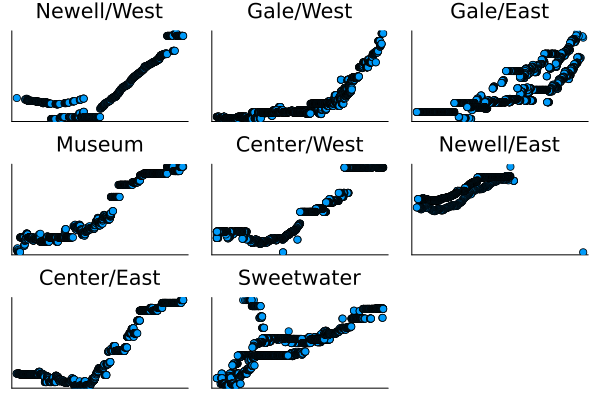

In [26]:
# the dictionary allows us to quickly access, plot, and apply operations to all of our data

plts = []
for k in keys(all_dfs)
     df = stack_df_vectors(all_dfs[k])
     if k != "Museum"
          plt = scatter(df.latitude, df.altitude, title="$k", )
     else
          plt = scatter(df.longitude, df.altitude, title="$k")
     end
     push!(plts, plt)
end

plot(plts..., xticks=:none, yticks=:none, legend=:none )


##### Unit Overview

Altitude: Meters above the WGS84 Ellipsoid

Latitude: Degrees , positive values are North of the equator (-90 to 90)

Longitude: Degrees, positive values are east of the meridian line (-180 to 180)

We have chosen to scale our latitude and longitude values to better reflect the dynamic range of our data

Scaled latitude: arcseconds from $29.64^\circ$ N

Scaled longitude: arcseconds from $-82.35^\circ$ E

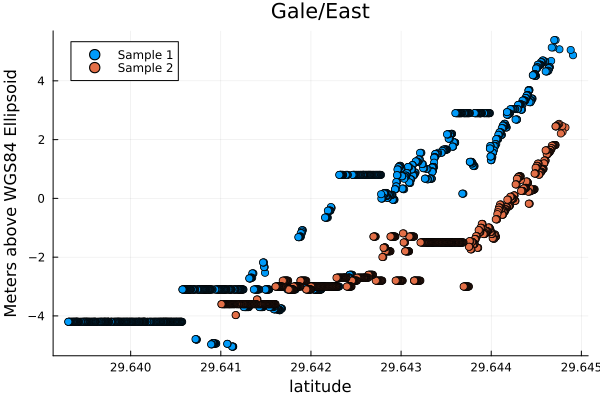

In [38]:
ge_dfs = all_dfs["Gale/East"];
gedf = stack_df_vectors(ge_dfs)

plt = scatter(ge_df.latitude, ge_df.altitude, group=ge_df.sample, 
     xlabel="latitude", ylabel="Meters above WGS84 Ellipsoid", title="Gale/East")


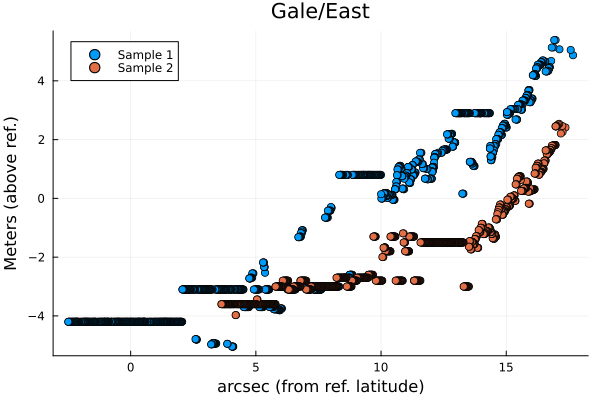

In [28]:
# scaled data 
scaled_gedf = scale_coordinates(gedf)
plt = scatter(scaled_gedf.latitude, scaled_gedf.altitude, group=scaled_gedf.sample, 
     xlabel="arcsec (from ref. latitude)", ylabel="Meters (above ref.)", title="Gale/East")

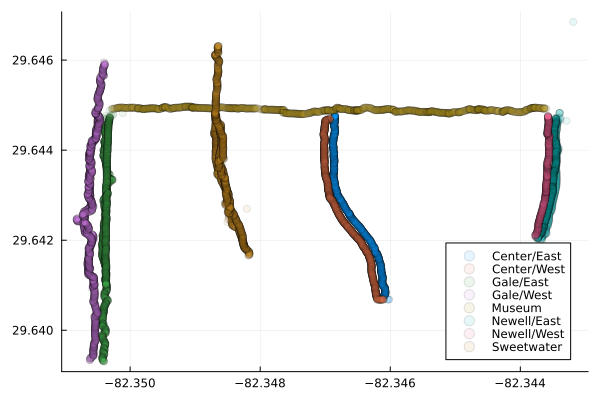

In [29]:
# using all of our data at once 
df = stack_all_streets(all_dfs);
scatter(df.longitude, df.latitude, group=df.street, ma=0.1)


---

## Cubic Splines

#### Splines
Splines are piecewise defined curves that fits cubic polynomials between two adjacent points. The most common use of splines are for interpolation and smoothing data.

1. **Piecewise Cubic Plynomials**: Splines are created by dividng a domain into smaller segments or intervals. Then a polynomial function is created to interpolate the data in those segments.
2. **Interpolation**: Splines are created so that the cubic polynomials pass through each of the data points to interpolate the data accurately.
3. **Continuity**: Splines maintain continuity between segments creating a smooth curve that does not contain sharp bends or corners.
4. **End Points**: It is important that splines define the behavior at the endpoints to ensure that the interpolation is smooth and accurate.

#### Implementation

Because splines 


In [7]:
## Spline Code Here
"""
    spinterp(t,y)

Construct a cubic not-a-knot spline interpolating function for data
values in `y` given at nodes in `t`.
"""
function spinterp(t,y)
    n = length(t)-1
    h = [ t[k+1]-t[k] for k in 1:n ]

    # Preliminary definitions.
    Z = zeros(n,n);
    In = I(n);  E = In[1:n-1,:];
    J = diagm(0=>ones(n),1=>-ones(n-1))
    H = diagm(0=>h)

    # Left endpoint interpolation:
    AL = [ In Z Z Z ]
    vL = y[1:n]

    # Right endpoint interpolation:
    AR = [ In H H^2 H^3 ];
    vR = y[2:n+1]

    # Continuity of first derivative:
    A1 = E*[ Z J 2*H 3*H^2 ]
    v1 = zeros(n-1)

    # Continuity of second derivative:
    A2 = E*[ Z Z J 3*H ]
    v2 = zeros(n-1)

    # Not-a-knot conditions:
    nakL = [ zeros(1,3*n) [1 -1 zeros(1,n-2)] ]
    nakR = [ zeros(1,3*n) [zeros(1,n-2) 1 -1] ]

    # Assemble and solve the full system.
    A = [ AL; AR; A1; A2; nakL; nakR ]
    v = [ vL; vR; v1; v2; 0; 0 ]
    z = A\v

    # Break the coefficients into separate vectors.
    rows = 1:n
    a = z[rows]
    b = z[n.+rows];  c = z[2*n.+rows];  d = z[3*n.+rows]
    S = [ Polynomial([a[k],b[k],c[k],d[k]]) for k in 1:n ]

    # This function evaluates the spline when called with a value
    # for x.
    return function (x)
        if x < t[1] || x > t[n+1]    # outside the interval
            return NaN
        elseif x==t[1]
            return y[1]
        else
            k = findlast(x .> t)    # last node to the left of x
            return S[k](x-t[k])
        end
    end
end

spinterp

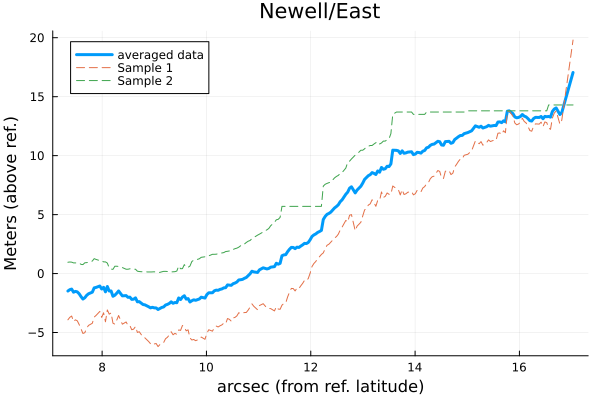

In [60]:

nedf = all_dfs["Newell/East"];
filtered_nedf = get_filtered_points(nedf)

stacked_nedf = scale_coordinates(stack_df_vectors(filtered_nedf))
avg_nedf = scale_coordinates(combine_df_vectors(filtered_nedf))


plot(avg_nedf.latitude, avg_nedf.altitude, label="averaged data", ylabel="Meters (above ref.)",
     xlabel= "arcsec (from ref. latitude)", title="Newell/East",lw=3)
plot!(stacked_nedf.latitude, stacked_nedf.altitude, group=stacked_nedf.sample, ls=:dash)


---

## One Dimensional Regression Methods

### Ridge Regression

In [31]:
## Rid Reg Code HERE

..........................................................................................................................................................................

### Levenberg

In [32]:
## Levenberg Code HERE

..........................................................................................................................................................................

### Utilizing a Design Matrix
.
.
.


In [33]:
## Design matrix code HERE

..........................................................................................................................................................................

### Using an Optimizer
.
.
.

In [34]:
## Optim code here

..........................................................................................................................................................................

#### Comparing 1d Regression Implementations
.
.
.


In [35]:
## Comparisons here

---

## Two Dimensional Regression 

### Using a Design 
.
.
.

In [36]:
## 2d Design matrix code

..........................................................................................................................................................................

### Using an Optimizer
.
.
.


In [37]:
## 2d optimizer 

..........................................................................................................................................................................